In [ ]:
#!unzip -q "drive/MyDrive/Butterfly/Butterfly-&-Moths-Image-Classification-100-species.zip" -d "/content/drive/MyDrive/Butterfly/"


# End-to-End Multiclass Butterfly and Moth Species Classification

# 1. 🦋 Project Overview ✅

## Problem Definition
Build a deep learning model that can classify images of butterflies and moths into 100 distinct species.
It is a multi-class image classification problem where the model must output a single species label for each input image.

## Dataset

1 Name: Butterfly & Moths Image Classification – 100 Species

2 Structure:

- Train: 12,594 images in 100 subdirectories (one per species).

- Validation: 500 images (5 images per species).

- Test: 500 images (5 images per species).

- CSV File: butterflies and moths.csv with 4 columns (class_id, filepaths, labels, dataset) linking each image to its label and dataset split.

3 Image Format: All images are 224×224×3 JPG files.

4 Balance: The training set is not perfectly balanced—each class has at least 101 images but different totals.

## Goal / Output

* Input: a single 224×224 RGB image of a butterfly or moth.

* Output: predicted species name (one of 100 classes) with confidence score.

## Evaluation Metrics
To capture both overall accuracy and class-wise performance (important with 100 classes and slight imbalance):

* Top-1 Accuracy on the test set.

* Macro-averaged Precision, Recall, and F1-score.

* Confusion Matrix to inspect per-species misclassifications.

## Key Features / Inputs

* Raw RGB pixel values from images.

* Augmented images (rotation, flips, brightness, zoom) to increase diversity and reduce overfitting.

# 2. Get Your Workspace Ready ✅

In [1]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import math
import io
import gradio as gr
from PIL import Image
from collections import Counter
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
import json
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image





In [2]:
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU avaliability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available


# 3. Getting the Data Ready (turning into Tensors)✅

With all machine learning, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

## Inspect:

* Number of classes (100).

* Images per class; look for underrepresented species.

## Check class imbalance:

* Count images per species.

* Plot a bar chart of class counts.

#### Preprocess: resize (e.g., 224×224), normalize pixel values.

#### Create your own validation split if not provided.

Number of classes: 100
split
test       500
train    12594
valid      500
Name: images, dtype: int64 

Classes missing in valid: None
Classes missing in test: None


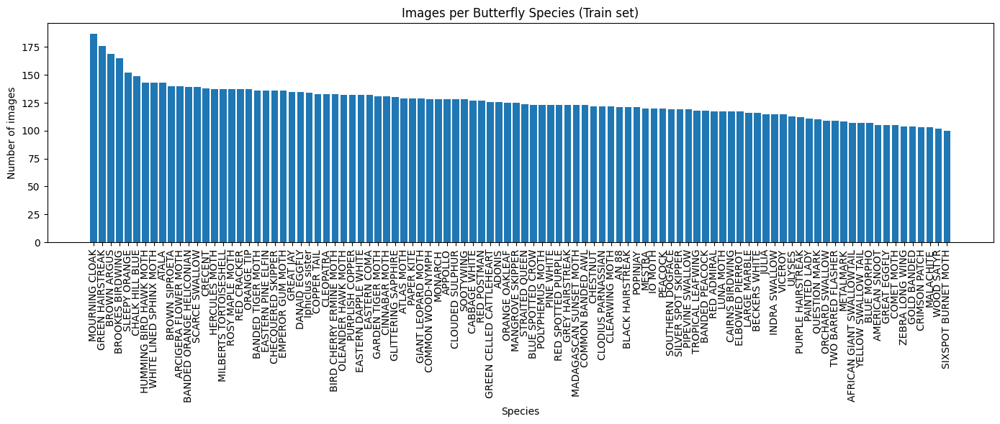

In [3]:
# --- CONFIG ---
# Define the base directory for the dataset. Assuming it's in /content/drive/MyDrive/Butterfly/
base_dir = Path("/content/drive/MyDrive/Butterfly/")
splits   = ["train", "valid", "test"]

# --- COUNT IMAGES PER CLASS ---
def count_images(split_dir):
    counts = {}
    # List directories (species) within each split
    for cls in os.listdir(split_dir):
        cls_path = split_dir / cls
        if cls_path.is_dir():
            # Count files within each species directory
            counts[cls] = len(list(cls_path.glob("*.*")))
    return counts

all_counts = {}
for s in splits:
    split_path = base_dir / s
    if split_path.exists():
        all_counts[s] = count_images(split_path)
    else:
        print(f"Warning: Directory for split '{s}' not found at {split_path}")


# --- Convert to DataFrame for easy analysis ---
df_list = []
for s, counts in all_counts.items():
    for cls, n in counts.items():
        df_list.append({"split": s, "class": cls, "images": n})

df = pd.DataFrame(df_list)

# --- Basic checks ---
if not df.empty:
    print("Number of classes:", df['class'].nunique())
    print(df.groupby("split")["images"].sum(), "\n")

    # Ensure every class in train appears in valid/test
    if "train" in all_counts and ("valid" in all_counts or "test" in all_counts):
        train_classes = set(all_counts.get("train", {}).keys())
        valid_classes = set(all_counts.get("valid", {}).keys())
        test_classes = set(all_counts.get("test", {}).keys())

        if valid_classes:
            missing_in_valid = train_classes - valid_classes
            print("Classes missing in valid:", missing_in_valid if missing_in_valid else "None")

        if test_classes:
            missing_in_test = train_classes - test_classes
            print("Classes missing in test:", missing_in_test if missing_in_test else "None")


    # --- Plot class distribution for train set ---
    train_counts = df[df["split"] == "train"].sort_values("images", ascending=False)
    plt.figure(figsize=(14,6))
    plt.bar(train_counts["class"], train_counts["images"])
    plt.xticks(rotation=90)
    plt.title("Images per Butterfly Species (Train set)")
    plt.xlabel("Species")
    plt.ylabel("Number of images")
    plt.tight_layout()
    plt.show()
else:
    print("No data found in the specified base directory and splits.")

In [4]:
# Check the value count for each class
df['class'].value_counts()



,count
class,
ADONIS,3
AFRICAN GIANT SWALLOWTAIL,3
AMERICAN SNOOT,3
AN 88,3
APPOLLO,3
...,...
VICEROY,3
WHITE LINED SPHINX MOTH,3
WOOD SATYR,3


In [5]:
# What's the median number of images per class?
class_counts = df['class'].value_counts()
median_count = class_counts.median()
print(f"The median number of images per class is: {median_count}")

The median number of images per class is: 3.0


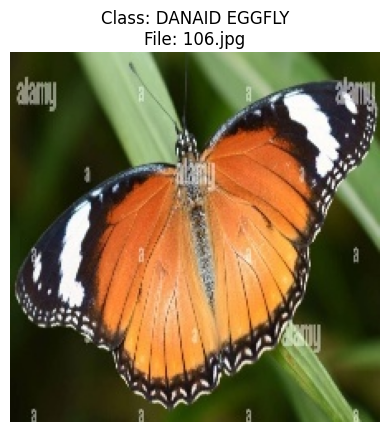

In [6]:
# Let's view an image

# Path to your training folder (adjust if needed)
train_dir = Path("/content/drive/MyDrive/Butterfly/train")

# Pick a random class folder
random_class = random.choice([d for d in train_dir.iterdir() if d.is_dir()])

# Pick a random image from that class
sample_image_path = random.choice(list(random_class.glob("*.*")))

# Open and display
img = Image.open(sample_image_path)

plt.imshow(img)
plt.title(f"Class: {random_class.name}\nFile: {sample_image_path.name}")
plt.axis("off")
plt.show()

# 4. Map Images to Labels ✅

* Create a dataframe or dictionary mapping image paths to species labels.

* Verify label consistency (no typos or missing entries).

In [7]:
# Create a dataframe or dictionary mapping image paths to species labels.
base_dir = Path("/content/drive/MyDrive/Butterfly/")
splits   = ["train", "valid", "test"]

records = []
for split in splits:
    split_path = base_dir / split
    for species_dir in split_path.iterdir():
        if species_dir.is_dir():
            species_name = species_dir.name
            for img_path in species_dir.glob("*.*"):
                records.append({
                    "split": split,
                    "species": species_name,
                    "filepath": str(img_path)
                })

df_map = pd.DataFrame(records)

# Quick sanity checks
print(df_map.head())
print("\nCounts per split:\n", df_map["split"].value_counts())
print("\nNumber of unique species:", df_map["species"].nunique())

# Confirm every species exists in each split (if expected)
for s in splits:
    print(f"{s} unique species:", df_map[df_map["split"] == s]["species"].nunique())

   split species                                           filepath
0  train  ADONIS  /content/drive/MyDrive/Butterfly/train/ADONIS/...
1  train  ADONIS  /content/drive/MyDrive/Butterfly/train/ADONIS/...
2  train  ADONIS  /content/drive/MyDrive/Butterfly/train/ADONIS/...
3  train  ADONIS  /content/drive/MyDrive/Butterfly/train/ADONIS/...
4  train  ADONIS  /content/drive/MyDrive/Butterfly/train/ADONIS/...

Counts per split:
 split
train    12594
valid      500
test       500
Name: count, dtype: int64

Number of unique species: 100
train unique species: 100
valid unique species: 100
test unique species: 100


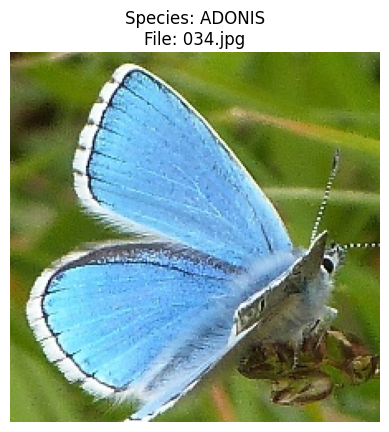

In [8]:
# Display an image from the 'ADONIS' species

# Select all file paths for the 'ADONIS' species
adonis_images = df_map[df_map['species'] == 'ADONIS']['filepath'].tolist()

# Check if there are images for 'ADONIS'
if adonis_images:
    # Pick a random image path from the list
    random_adonis_image_path = random.choice(adonis_images)

    # Open and display the image
    img = Image.open(random_adonis_image_path)

    plt.imshow(img)
    plt.title(f"Species: ADONIS\nFile: {Path(random_adonis_image_path).name}")
    plt.axis("off")
    plt.show()
else:
    print("No images found for the ADONIS species.")

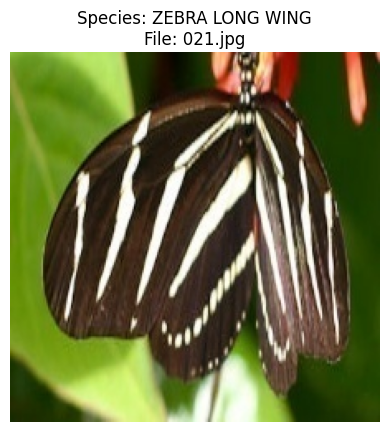

In [9]:
# Display an image from the 'ZEBRA LONG WING' species
# Select all file paths for the 'ZEBRA LONG WING' species
zebra_images = df_map[df_map['species'] == 'ZEBRA LONG WING']['filepath'].tolist()

# Check if there are images for 'ZEBRA LONG WING'
if zebra_images:
    # Pick a random image path from the list
    random_zebra_image_path = random.choice(zebra_images)

    # Open and display the image
    img = Image.open(random_zebra_image_path)

    plt.imshow(img)
    plt.title(f"Species: ZEBRA LONG WING\nFile: {Path(random_zebra_image_path).name}")
    plt.axis("off")
    plt.show()



In [10]:
# Check length of unique labels values
len(df_map['species'].unique())

100

In [11]:
# Check the unique species
unique_species = df_map['species'].unique()
print(unique_species)

['ADONIS' 'AFRICAN GIANT SWALLOWTAIL' 'AMERICAN SNOOT' 'AN 88' 'APPOLLO'
 'ARCIGERA FLOWER MOTH' 'ATALA' 'ATLAS MOTH' 'BANDED ORANGE HELICONIAN'
 'BANDED PEACOCK' 'BANDED TIGER MOTH' 'BECKERS WHITE'
 'BIRD CHERRY ERMINE MOTH' 'BLACK HAIRSTREAK' 'BLUE MORPHO'
 'BLUE SPOTTED CROW' 'BROOKES BIRDWING' 'BROWN ARGUS' 'BROWN SIPROETA'
 'CABBAGE WHITE' 'CAIRNS BIRDWING' 'CHALK HILL BLUE' 'CHECQUERED SKIPPER'
 'CHESTNUT' 'CINNABAR MOTH' 'CLEARWING MOTH' 'CLEOPATRA'
 'CLODIUS PARNASSIAN' 'CLOUDED SULPHUR' 'COMET MOTH' 'COMMON BANDED AWL'
 'COMMON WOOD-NYMPH' 'COPPER TAIL' 'CRECENT' 'CRIMSON PATCH'
 'DANAID EGGFLY' 'EASTERN COMA' 'EASTERN DAPPLE WHITE'
 'EASTERN PINE ELFIN' 'ELBOWED PIERROT' 'EMPEROR GUM MOTH'
 'GARDEN TIGER MOTH' 'GIANT LEOPARD MOTH' 'GLITTERING SAPPHIRE'
 'GOLD BANDED' 'GREAT EGGFLY' 'GREAT JAY' 'GREEN CELLED CATTLEHEART'
 'GREEN HAIRSTREAK' 'GREY HAIRSTREAK' 'HERCULES MOTH'
 'HUMMING BIRD HAWK MOTH' 'INDRA SWALLOW' 'IO MOTH' 'Iphiclus sister'
 'JULIA' 'LARGE MARBLE' 'LUNA MOTH

In [12]:
# Turn a single species into an array of booleans
print(unique_species[0] == unique_species) # Accessing the first element of unique_species
print(unique_species[0])

[ True False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False]
ADONIS


In [13]:
# Turn every label into a boolean array
boolean_species = [specie == unique_species for specie in unique_species]
boolean_species[:3] # Accessing the first two three elements using slicing

[array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False]),
 array([False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, Fal

# 5. Encode Labels ✅
* Convert species names to integers (0–99) or one-hot vectors.

In [14]:
# --- Integer encode species names ---
le = LabelEncoder()
df_map["class_id"] = le.fit_transform(df_map["species"])

# Verify
print(df_map[["species", "class_id"]].head())
print("Number of unique classes:", len(le.classes_))

# Let's create a dictionary for easy lookups
id_to_species = dict(enumerate(le.classes_))
species_to_id = {v: k for k, v in id_to_species.items()}

# --- One-hot encoding ---
# This creates a NumPy array of shape (n_samples, n_classes)
one_hot_labels = to_categorical(df_map["class_id"])

print("One-hot shape:", one_hot_labels.shape)


  species  class_id
0  ADONIS         0
1  ADONIS         0
2  ADONIS         0
3  ADONIS         0
4  ADONIS         0
Number of unique classes: 100
One-hot shape: (13594, 100)


In [15]:
# Check the length of dataset
len(df_map)

13594

# 6. Preprocessing & Augmentation ✅
* Data augmentation (rotation, flip, zoom, brightness/contrast, color jitter).
* Apply stronger augmentation or oversampling to minority classes if needed.
* Convert images to tensors ready for model input.


In [16]:
# --- Config ---
base_dir = Path("/content/drive/MyDrive/Butterfly/")
img_size = (224, 224)
batch_size = 32

# --- Data Augmentation for Training ---
train_datagen = ImageDataGenerator(
    rescale=1./255,              # normalize pixel values
    rotation_range=30,           # random rotation
    width_shift_range=0.1,       # horizontal shift
    height_shift_range=0.1,      # vertical shift
    shear_range=0.1,             # shear
    zoom_range=0.2,              # zoom
    horizontal_flip=True,        # horizontal flip
    vertical_flip=True,          # vertical flip
    brightness_range=[0.8,1.2],  # brightness jitter
    fill_mode='nearest'
)

# For validation and test, only rescale
val_test_datagen = ImageDataGenerator(rescale=1./255)

# --- Generators ---
train_generator = train_datagen.flow_from_directory(
    directory=str(base_dir / "train"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # one-hot labels
    shuffle=True
)

validation_generator = val_test_datagen.flow_from_directory(
    directory=str(base_dir / "valid"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    directory=str(base_dir / "test"),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 12594 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


In [17]:
# --- Step: Handle Class Imbalance ---

# 1️⃣ Get all integer class IDs for the training set
y_train = df_map[df_map['split'] == 'train']['class_id'].values

# 2️⃣ Compute class weights (balanced)
class_weights = compute_class_weight(
    class_weight='balanced',        # inversely proportional to frequency
    classes=np.unique(y_train),
    y=y_train
)

# 3️⃣ Convert to dictionary format for model.fit()
class_weights_dict = {i: w for i, w in enumerate(class_weights)}

# 4️⃣ Print sample weights
print("Sample class weights for first 5 classes:")
for i in range(5):
    print(f"Class {i}: weight = {class_weights_dict[i]:.2f}")


Sample class weights for first 5 classes:
Class 0: weight = 1.00
Class 1: weight = 1.18
Class 2: weight = 1.20
Class 3: weight = 1.04
Class 4: weight = 0.98


# 7. Data Batching ✅
* Use tf.data or Keras ImageDataGenerator/image_dataset_from_directory.
* Shuffle and batch data for efficient GPU usage.


In [18]:
# Training dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=str(base_dir / "train"),
    label_mode='categorical',  # one-hot labels
    image_size=img_size,
    batch_size=batch_size,
    shuffle=True
)

# Validation dataset
val_ds = tf.keras.utils.image_dataset_from_directory(
    directory=str(base_dir / "valid"),
    label_mode='categorical',
    image_size=img_size,
    batch_size=batch_size,
    shuffle=False
)

# Test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=str(base_dir / "test"),
    label_mode='categorical',
    image_size=img_size,
    batch_size=batch_size,
    shuffle=False
)

# Normalize pixel values
train_ds = train_ds.map(lambda x, y: (x/255.0, y))
val_ds = val_ds.map(lambda x, y: (x/255.0, y))
test_ds = test_ds.map(lambda x, y: (x/255.0, y))


Found 12594 files belonging to 100 classes.
Found 500 files belonging to 100 classes.
Found 500 files belonging to 100 classes.


# 8. Visualize Batches ✅
* Plot a few batches with their labels to confirm preprocessing and augmentation.


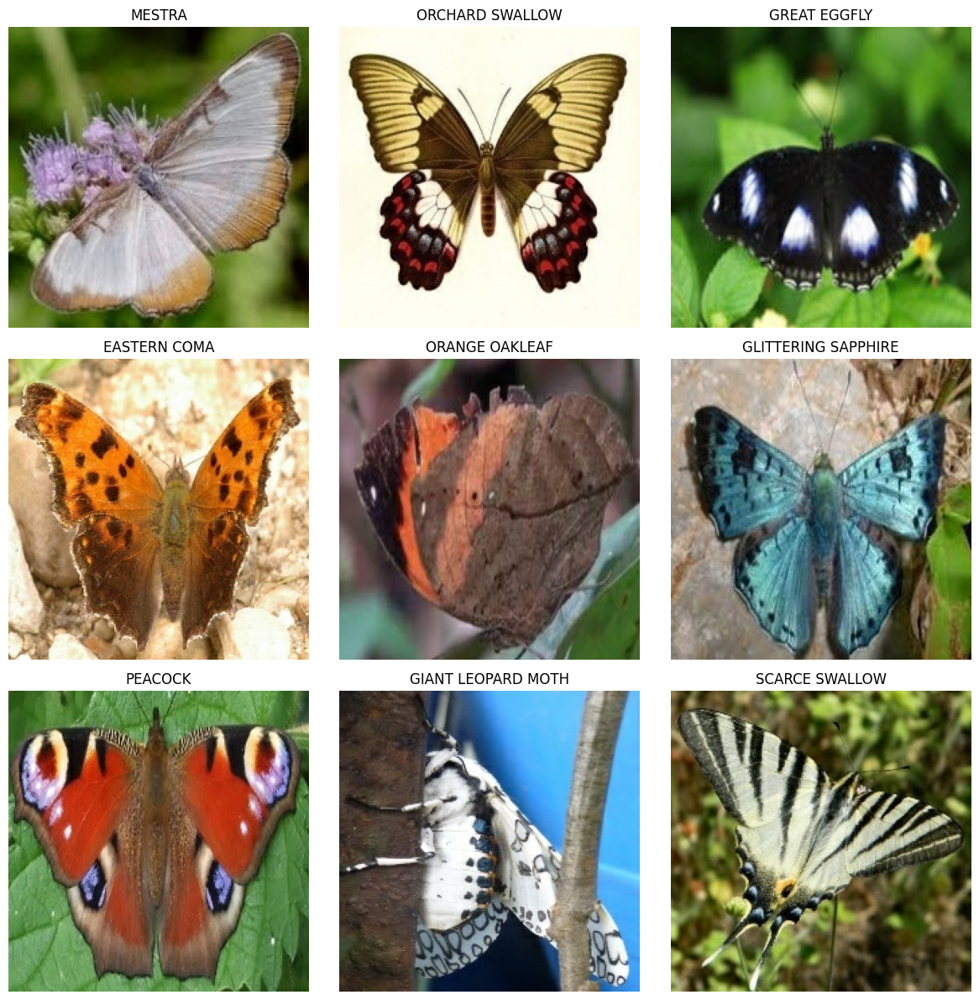

In [19]:
# Create mapping from class_id to species name
id_to_species = dict(zip(df_map['class_id'], df_map['species']))

# Take one batch
for images, labels in train_ds.take(1):
    images = images.numpy()
    labels = labels.numpy()
    break

# Plot first 9 images with species names
plt.figure(figsize=(12,12))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i])
    plt.title(id_to_species[np.argmax(labels[i])])
    plt.axis('off')
plt.tight_layout()
plt.show()


  species  class_id
0  ADONIS         0
1  ADONIS         0
2  ADONIS         0
3  ADONIS         0
4  ADONIS         0
Number of unique classes: 100
Label map saved to: /content/drive/MyDrive/Butterfly/label_map.json


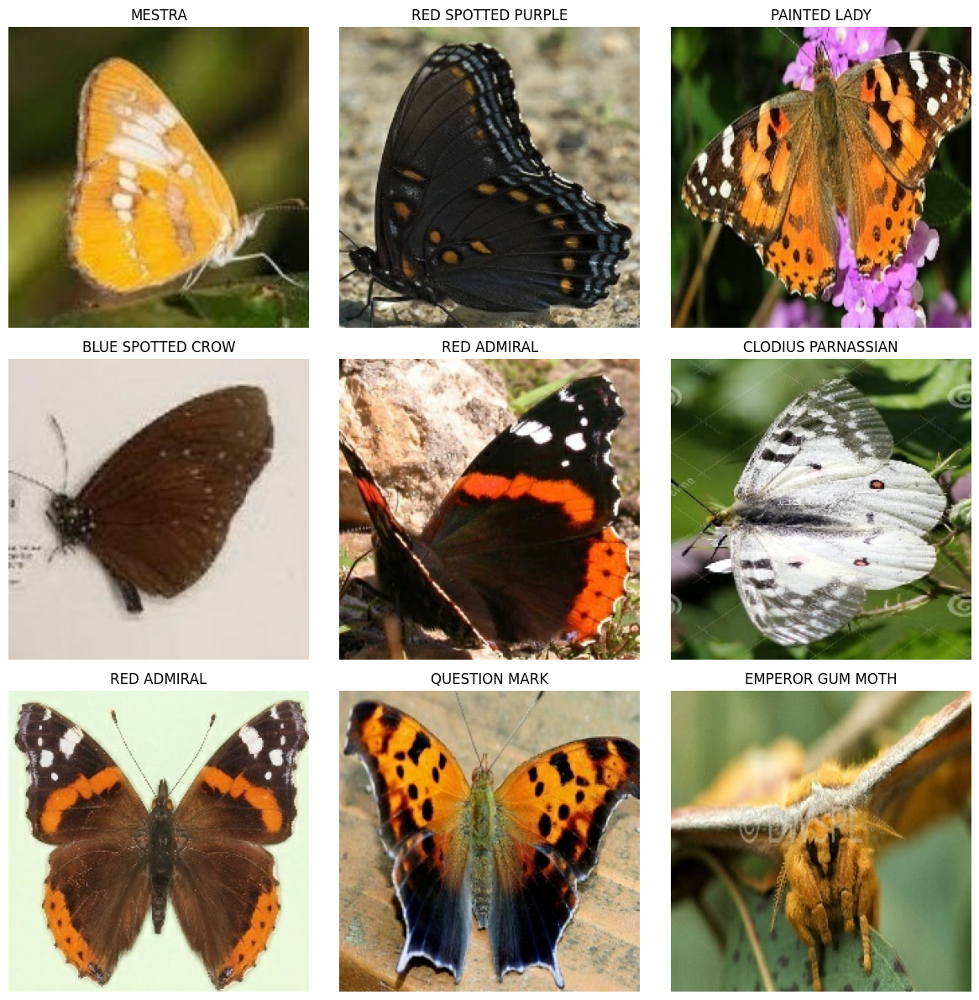

In [20]:
# --- 1️⃣ Encode species names as integers ---
le = LabelEncoder()
df_map["class_id"] = le.fit_transform(df_map["species"])

print(df_map[["species", "class_id"]].head())
print("Number of unique classes:", len(le.classes_))

# --- 2️⃣ Save/Load mapping dictionaries ---
#   • integer id → species name
#   • species name → integer id
id_to_species = {i: name for i, name in enumerate(le.classes_)}
species_to_id = {v: k for k, v in id_to_species.items()}

# --- Set project folder and save label map ---
project_path = "/content/drive/MyDrive/Butterfly"
label_map_path = os.path.join(project_path, "label_map.json")

# Save id_to_species mapping to JSON
with open(label_map_path, "w") as f:
    json.dump(id_to_species, f, indent=4)
print(f"Label map saved to: {label_map_path}")

# --- 4️⃣ Quick visual check of a training batch ---
for images, labels in train_ds.take(1):  # assumes you already created train_ds
    images = images.numpy()
    labels = labels.numpy()
    break

plt.figure(figsize=(12,12))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i])
    # use np.argmax because labels are one-hot in this dataset
    class_id = np.argmax(labels[i])
    plt.title(id_to_species[class_id])
    plt.axis("off")
plt.tight_layout()
plt.show()


# 9. Build the Model (Transfer Learning) ✅
* Choose a strong backbone for many classes: EfficientNetB4/B5, ResNet50, or MobileNetV3.
* Remove the top layer, add:
    * GlobalAveragePooling.
    * Dropout for regularization.
    * Dense layer with 100 units + softmax activation.
* Freeze the base model initially.


In [21]:
img_size = (224, 224, 3)
num_classes = 100
dropout_rate = 0.5

# --- Load base model ---
base_model = EfficientNetB4(
    include_top=False,           # remove the original classification head
    weights='imagenet',          # pre-trained on ImageNet
    input_shape=img_size,
)

# Freeze base model initially
base_model.trainable = False

# --- Build the full model ---
inputs = tf.keras.Input(shape=img_size)
x = base_model(inputs, training=False)  # set training=False for batchnorm layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(dropout_rate)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

# --- Compile model ---
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# --- Model summary ---
model.summary()


71686520/71686520 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb4 (Functional)     │ (None, 7, 7, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1792)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       179,300 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,853,123 (68.10 MB)

 Trainable params: 179,300 (700.39 KB)

 Non-trainable params: 17,673,823 (67.42 MB)

# 10. Callbacks ✅
* EarlyStopping (monitor val_loss).
* ReduceLROnPlateau.
* ModelCheckpoint to save best weights.

In [22]:
# --- Early stopping: stop training if val_loss doesn't improve for 5 epochs ---
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# --- Reduce learning rate when a metric has stopped improving ---
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,         # reduce LR by half
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# --- Save the best model during training ---
checkpoint = ModelCheckpoint(
    filepath= "/content/drive/MyDrive/Butterfly/best_model1.keras",
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

# --- Combine callbacks ---
callbacks = [early_stop, reduce_lr, checkpoint]

In [23]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


# 11. Initial Training on Subset (Optional) ✅
* Train on a small subset to verify the pipeline and model compile settings.


In [24]:
# --- Use a small subset of the training generator ---
subset_size = 500  # number of images to test the pipeline
train_subset = train_generator

# Calculate steps per epoch for the subset
steps_per_epoch_subset = subset_size // train_generator.batch_size

# --- Train the model on the subset ---
history_subset = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch_subset,
    validation_data=validation_generator,
    validation_steps=5,  # small number of validation steps
    epochs=3,            # just a few epochs for testing
    class_weight=class_weights_dict,
    callbacks=callbacks
)


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/3
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0168 - loss: 4.7442 
Epoch 1: val_loss improved from inf to 4.86231, saving model to /content/drive/MyDrive/Butterfly/best_model1.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 306s 17s/step - accuracy: 0.0164 - loss: 4.7498 - val_accuracy: 0.0000e+00 - val_loss: 4.8623 - learning_rate: 0.0010
Epoch 2/3
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0187 - loss: 4.9299 
Epoch 2: val_loss improved from 4.86231 to 4.76691, saving model to /content/drive/MyDrive/Butterfly/best_model1.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 161s 11s/step - accuracy: 0.0186 - loss: 4.9220 - val_accuracy: 0.0000e+00 - val_loss: 4.7669 - learning_rate: 0.0010
Epoch 3/3
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0109 - loss: 4.7099 
Epoch 3: val_loss improved from 4.76691 to 4.76435, saving model to /content/drive/MyDrive/Butterfly/best_model1.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 202s 14s/step - accuracy: 0.0110 - loss: 4.7093 - val_accuracy: 0.0312 - val_l

# 12. Training on Full Dataset ✅
* Train with the entire training set.
* If the imbalance is significant, provide class_weight to the loss function.
* Monitor training/validation curves.

In [26]:
# Full Dataset Training (Top Layers Only)

# --- CONFIG ---
img_size = (224, 224, 3)
num_classes = 100
dropout_rate = 0.5
batch_size = 16        # adjust based on GPU
epochs_top = 30
learning_rate_top = 1e-3

# --- Build the model ---
base_model = EfficientNetB4(
    include_top=False,
    weights='imagenet',
    input_shape=img_size
)
base_model.trainable = False  # freeze base model

inputs = tf.keras.Input(shape=img_size)
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(dropout_rate)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate_top),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

## 12a. Set Up Callbacks ✅

In [27]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
checkpoint = ModelCheckpoint("/content/drive/MyDrive/Butterfly/best_model.keras", monitor='val_loss', save_best_only=True, verbose=1)
callbacks = [early_stop, reduce_lr, checkpoint]


## 12b. Train on Full Dataset (Top Layers) ✅

In [28]:
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = validation_generator.samples // validation_generator.batch_size

history_full = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    epochs=epochs_top,
    class_weight=class_weights_dict,  # handle class imbalance
    callbacks=callbacks,
    verbose=1
)

Epoch 1/30
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.0115 - loss: 4.7265 
Epoch 1: val_loss improved from inf to 4.55357, saving model to /content/drive/MyDrive/Butterfly/best_model.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 4448s 11s/step - accuracy: 0.0115 - loss: 4.7264 - val_accuracy: 0.0208 - val_loss: 4.5536 - learning_rate: 0.0010
Epoch 2/30
  1/393 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - accuracy: 0.0312 - loss: 4.4301

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_loss did not improve from 4.55357
393/393 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.0312 - loss: 4.4301 - val_accuracy: 0.0208 - val_loss: 4.5548 - learning_rate: 0.0010
Epoch 3/30
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 546ms/step - accuracy: 0.0140 - loss: 4.6496
Epoch 3: val_loss did not improve from 4.55357
393/393 ━━━━━━━━━━━━━━━━━━━━ 262s 667ms/step - accuracy: 0.0140 - loss: 4.6496 - val_accuracy: 0.0188 - val_loss: 4.5660 - learning_rate: 0.0010
Epoch 4/30
  1/393 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - accuracy: 0.0312 - loss: 4.6115
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 4: val_loss did not improve from 4.55357
393/393 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0312 - loss: 4.6115 - val_accuracy: 0.0188 - val_loss: 4.5673 - learning_rate: 0.0010
Epoch 5/30
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 541ms/step - accuracy: 0.0229 - loss: 4.5991
Epoch 5: val_loss improved from 4.55357 to 4.50953, saving model to /content/drive/MyDriv

# 13. Fine-Tuning (Unfreeze Base Model) ✅

In [29]:
# Unfreeze part or all of the base model
base_model.trainable = True
# Optionally freeze first N layers
for layer in base_model.layers[:200]:
    layer.trainable = False

# Compile with lower learning rate
learning_rate_ft = 1e-5
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate_ft),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train with fine-tuning
epochs_finetune = 10
history_finetune = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    validation_data=validation_generator,
    validation_steps=validation_steps,
    epochs=epochs_finetune,
    class_weight=class_weights_dict,
    callbacks=callbacks,
    verbose=1
)


Epoch 1/10
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - accuracy: 0.0173 - loss: 4.6808
Epoch 1: val_loss improved from 4.40994 to 4.28886, saving model to /content/drive/MyDrive/Butterfly/best_model.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 390s 740ms/step - accuracy: 0.0173 - loss: 4.6806 - val_accuracy: 0.0458 - val_loss: 4.2889 - learning_rate: 1.0000e-05
Epoch 2/10
  1/393 ━━━━━━━━━━━━━━━━━━━━ 1:51 284ms/step - accuracy: 0.1250 - loss: 4.2965
Epoch 2: val_loss improved from 4.28886 to 4.28818, saving model to /content/drive/MyDrive/Butterfly/best_model.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.1250 - loss: 4.2965 - val_accuracy: 0.0458 - val_loss: 4.2882 - learning_rate: 1.0000e-05
Epoch 3/10
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 595ms/step - accuracy: 0.0368 - loss: 4.4293
Epoch 3: val_loss improved from 4.28818 to 4.10418, saving model to /content/drive/MyDrive/Butterfly/best_model.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 240s 609ms/step - accuracy: 0.0368 - loss: 4.4293 - val_

## 13b. Plot Training Curves ✅

In [24]:
def plot_history(history, title="Training"):
    plt.figure(figsize=(12,5))
    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='train_acc')
    plt.plot(history.history['val_accuracy'], label='val_acc')
    plt.title(f'{title} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    # Loss
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.title(f'{title} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history_full, "Top Layers Training")
plot_history(history_finetune, "Fine-Tuning")


NameError: name 'history_full' is not defined

We can continue training for more epochs or unfreeze additional base-model layers if GPU memory allows.

🚀 Optional Next Tweaks

* More fine-tuning: Unfreeze more EfficientNet layers and lower learning rate further (e.g., 1e-6).

* Data augmentation: Stronger ImageDataGenerator settings can boost generalization.

* Balanced sampling: If some species remain rare, consider oversampling or a weighted sampler.

# 14. Predictions & Evaluation ✅
* Predict on validation/test sets.
* Compute accuracy, macro-precision, recall, and F1-score.
* Plot confusion matrix to see per-class performance.


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 6 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Test Accuracy:  0.0100
Macro Precision: 0.0001
Macro Recall:    0.0100
Macro F1-score:  0.0002


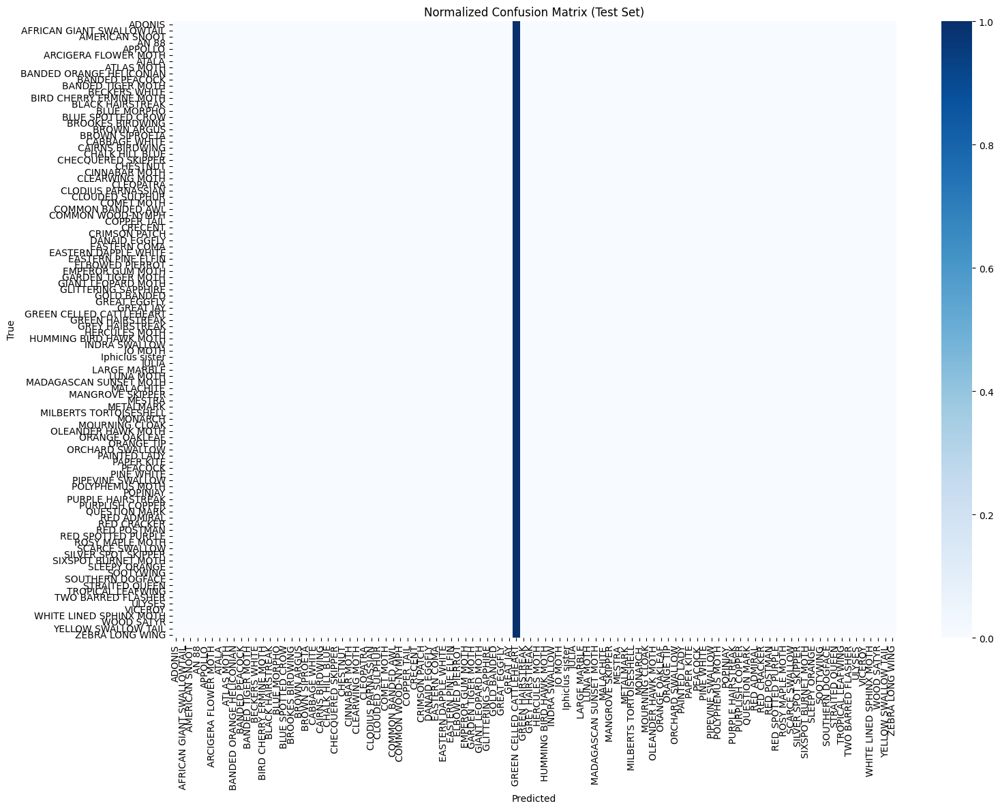

In [25]:
# --- Load the best trained model ---
project_folder = "/content/drive/MyDrive/Butterfly"
model_path = os.path.join(project_folder, "best_model.keras")
best_model = load_model(model_path)

# --- Load the label ↔ species mapping ---
label_map_path = os.path.join(project_folder, "label_map.json")
with open(label_map_path, "r") as f:
    id_to_species = json.load(f)

# --- Get class names in correct order ---
# Sort by integer keys to keep numeric order
class_names = [name for _, name in sorted(id_to_species.items(), key=lambda x: int(x[0]))]


# --- 1️⃣ Get all test image paths and true labels ---
# Assuming df_map DataFrame is available from previous cells
test_df = df_map[df_map['split'] == 'test'].copy()
test_img_paths = test_df['filepath'].tolist()
y_true_labels = test_df['class_id'].tolist()  # integer labels

# --- 2️⃣ Predict all test images ---
y_pred_labels = [] # Initialize y_pred_labels as an empty list
for img_path in test_img_paths:
    img = image.load_img(img_path, target_size=(224,224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0
    # Use the loaded best_model for prediction
    preds = best_model.predict(x, verbose=0)
    y_pred_labels.append(np.argmax(preds[0]))

# --- 3️⃣ Compute evaluation metrics ---
accuracy = accuracy_score(y_true_labels, y_pred_labels)
precision = precision_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)
recall = recall_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)

print(f"Test Accuracy:  {accuracy:.4f}")
print(f"Macro Precision: {precision:.4f}")
print(f"Macro Recall:    {recall:.4f}")
print(f"Macro F1-score:  {f1:.4f}")

# --- 4️⃣ Confusion Matrix (normalized for better visualization) ---
cm = confusion_matrix(y_true_labels, y_pred_labels)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# --- 5️⃣ Plot normalized confusion matrix ---
plt.figure(figsize=(16,12))
sns.heatmap(cm_norm, cmap='Blues', xticklabels=class_names, yticklabels=class_names,
            annot=False, fmt=".2f")  # annot=True is too dense for 100 classes
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix (Test Set)")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3007204266.py:20: RuntimeWarning: invalid value encountered in divide
  cm_top_norm = cm_top.astype('float') / cm_top.sum(axis=1)[:, np.newaxis]
/usr/local/lib/python3.12/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.12/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


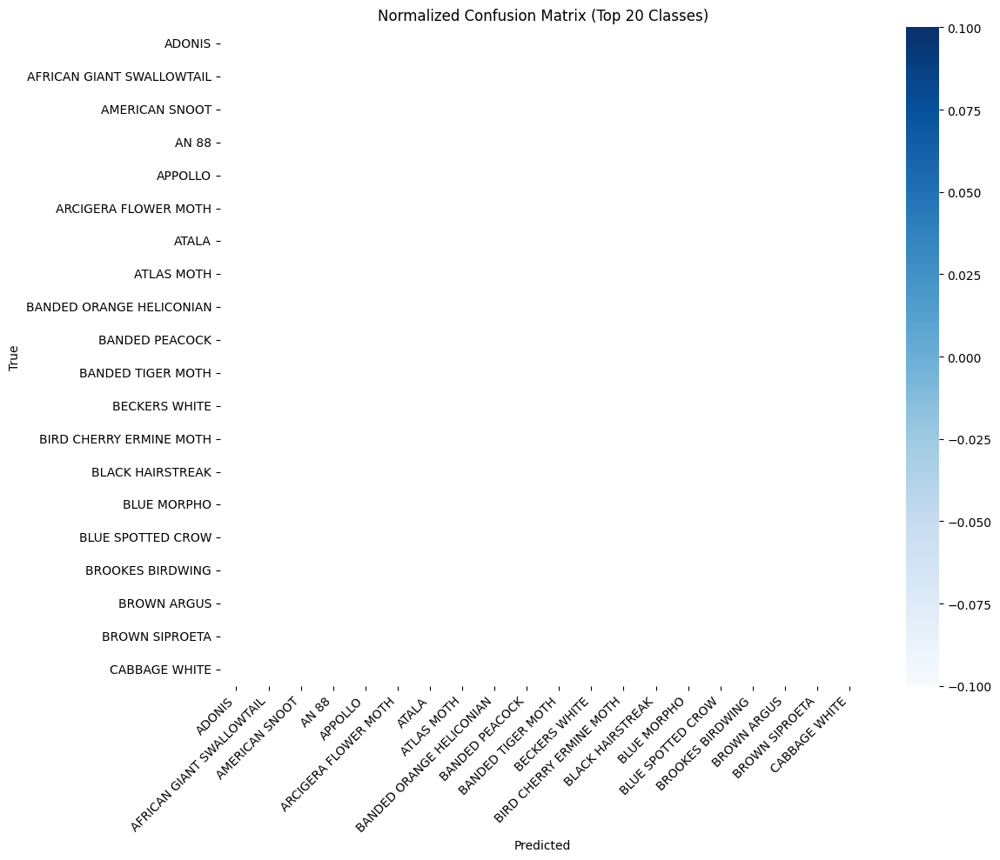

In [26]:
# Confusion matrix for the top N most frequent or misclassified classes

# --- 1️⃣ Count misclassifications per class ---
misclass_counts = np.abs(np.array(y_true_labels) - np.array(y_pred_labels))  # optional metric
# Alternatively, count by frequency of each class in test set
class_freq = Counter(y_true_labels)

# --- 2️⃣ Select top N frequent classes ---
top_n = 20
top_classes = [cls for cls, _ in class_freq.most_common(top_n)]

# Filter indices of test samples belonging to top_classes
indices = [i for i, cls in enumerate(y_true_labels) if cls in top_classes]

y_true_top = [y_true_labels[i] for i in indices]
y_pred_top = [y_pred_labels[i] for i in indices]

# --- 3️⃣ Compute confusion matrix for top N classes ---
cm_top = confusion_matrix(y_true_top, y_pred_top, labels=top_classes)
cm_top_norm = cm_top.astype('float') / cm_top.sum(axis=1)[:, np.newaxis]

# --- 4️⃣ Plot the heatmap ---
top_class_names = [class_names[i] for i in top_classes]

plt.figure(figsize=(12,10))
sns.heatmap(cm_top_norm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=top_class_names, yticklabels=top_class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title(f"Normalized Confusion Matrix (Top {top_n} Classes)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Darker cells show where each class is most often predicted.

# 15. Save & Load Model ✅
* Save weights and model architecture (.keras or SavedModel).
* Save label ↔ species mapping for future inference (.json).


In [27]:
# --- Set project folder path ---
project_folder = "/content/drive/MyDrive/Butterfly"

# Ensure the folder exists
os.makedirs(project_folder, exist_ok=True)

# --- 1️⃣ Save the trained model ---
model_path = os.path.join(project_folder, "best_model.keras")
model.save(model_path)
print(f"Model saved as {model_path}")

# --- 2️⃣ Save label ↔ species mapping ---
label_map_path = os.path.join(project_folder, "label_map.json")
with open(label_map_path, "w") as f:
    json.dump(id_to_species, f)
print(f"Label mapping saved to {label_map_path}")


Model saved as /content/drive/MyDrive/Butterfly/best_model.keras
Label mapping saved to /content/drive/MyDrive/Butterfly/label_map.json


## Load Trained Model & Label Map

In [28]:
# --- Set project folder path ---
project_folder = "/content/drive/MyDrive/Butterfly"

# --- Load the trained model ---
model_path = os.path.join(project_folder, "best_model.keras")
model = tf.keras.models.load_model(model_path) # Changed keras.models.load_model to tf.keras.models.load_model

# --- Load the label ↔ species mapping ---
label_map_path = os.path.join(project_folder, "label_map.json")
with open(label_map_path, "r") as f:
    id_to_species = json.load(f)

print("Model and label map reloaded successfully.")

Model and label map reloaded successfully.


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 6 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


These two files are all you need for future prediction or deployment.

# Step 16. Inference & Prediction ✅

## 1️⃣ Single Image Prediction ✅

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


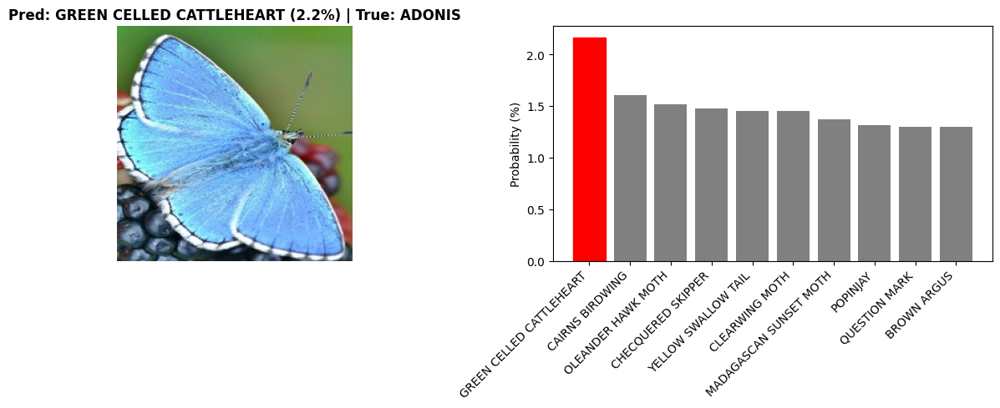

In [29]:
# --- Single Image Prediction Function ---
def predict_image_probs(img_path, model=best_model, target_size=(224, 224)):
    """
    Predicts probabilities for all classes for a single image.
    Returns prediction probabilities and the preprocessed image.
    """
    # Load & preprocess image
    img = image.load_img(img_path, target_size=target_size)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # rescale same as training

    # Predict probabilities
    preds = model.predict(x)[0]  # shape: (n_classes,)
    return preds, img

# --- Single Image Plot Function ---
def plot_pred_with_conf(pred_probs, true_label=None, img=None, class_names=class_names, top_n=10):
    """
    Displays an image alongside the top-N predicted class probabilities.
    Highlights the true label in green if present, else top prediction in red.
    """
    # Top-N predictions
    top_idx = pred_probs.argsort()[-top_n:][::-1]
    top_vals = pred_probs[top_idx] * 100
    top_labels = [class_names[i] for i in top_idx]

    # Predicted label and confidence
    pred_label = top_labels[0]
    top_conf = top_vals[0]

    # --- Plot ---
    fig, (ax_img, ax_bar) = plt.subplots(1, 2, figsize=(12, 5))

    if img is not None:
        ax_img.imshow(img)
        title = f"Pred: {pred_label} ({top_conf:.1f}%)"
        if true_label is not None:
            title += f" | True: {true_label}"
        ax_img.set_title(title, fontweight="bold")
        ax_img.axis("off")

    # Bar chart for top-N predictions
    bars = ax_bar.bar(np.arange(len(top_labels)), top_vals, color="grey")
    ax_bar.set_xticks(np.arange(len(top_labels)))
    ax_bar.set_xticklabels(top_labels, rotation=45, ha="right")
    ax_bar.set_ylabel("Probability (%)")

    # Highlight correct/incorrect
    if true_label is not None and true_label in top_labels:
        bars[np.argmax(np.array(top_labels) == true_label)].set_color("green")
    else:
        bars[0].set_color("red")

    plt.tight_layout()
    plt.show()

# --- Usage Example ---
sample_img_path = df_map[df_map['split']=='test'].iloc[0]['filepath']
true_label = df_map[df_map['split']=='test'].iloc[0]['species']
pred_probs, img = predict_image_probs(sample_img_path)
plot_pred_with_conf(pred_probs, true_label=true_label, img=img, class_names=class_names)


## 2️⃣ Multiple Images Prediction ✅

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


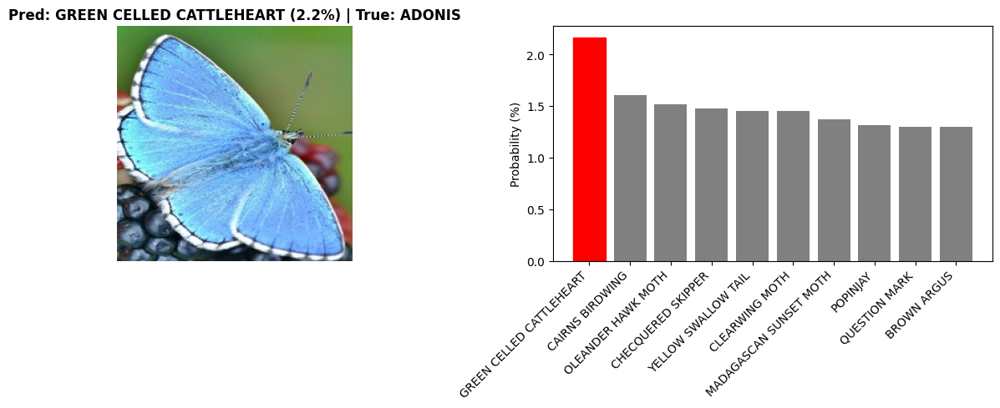

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


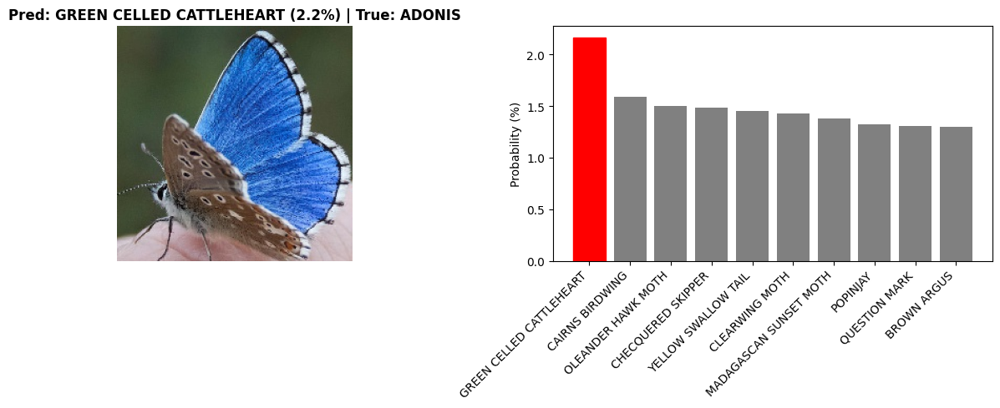

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


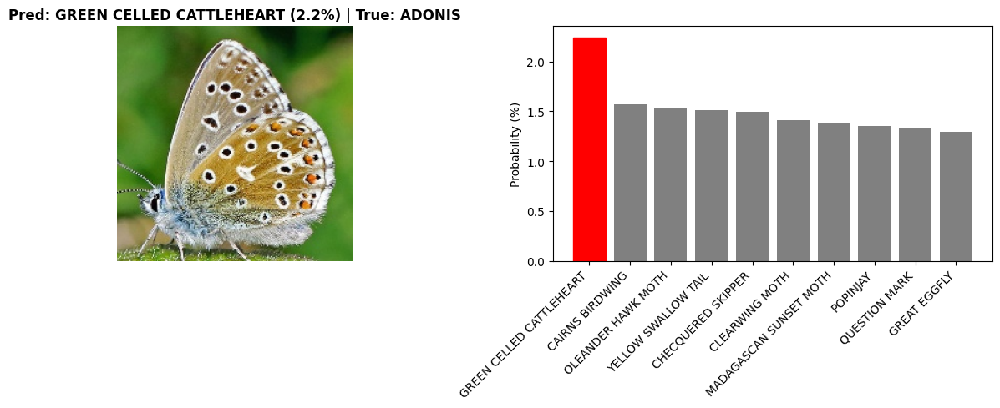

In [30]:
# --- Multiple Images Prediction Function ---
def predict_and_plot_multiple(img_paths, true_labels=None, model=best_model, class_names=class_names, top_n=10):
    """
    Predict and plot top-N class probabilities for multiple images.
    img_paths: list of image filepaths
    true_labels: list of true species names (optional)
    """
    for i, img_path in enumerate(img_paths):
        true_label = true_labels[i] if true_labels is not None else None
        pred_probs, img = predict_image_probs(img_path, model=model)
        plot_pred_with_conf(pred_probs, true_label=true_label, img=img, class_names=class_names, top_n=top_n)

# --- Usage Example ---
# Select first 3 images from test set
test_img_paths = df_map[df_map['split']=='test']['filepath'].iloc[:3].tolist()
test_true_labels = df_map[df_map['split']=='test']['species'].iloc[:3].tolist()

predict_and_plot_multiple(test_img_paths, test_true_labels, top_n=10)


## 3 Multiple Images in a Grid with Predictions ✅

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


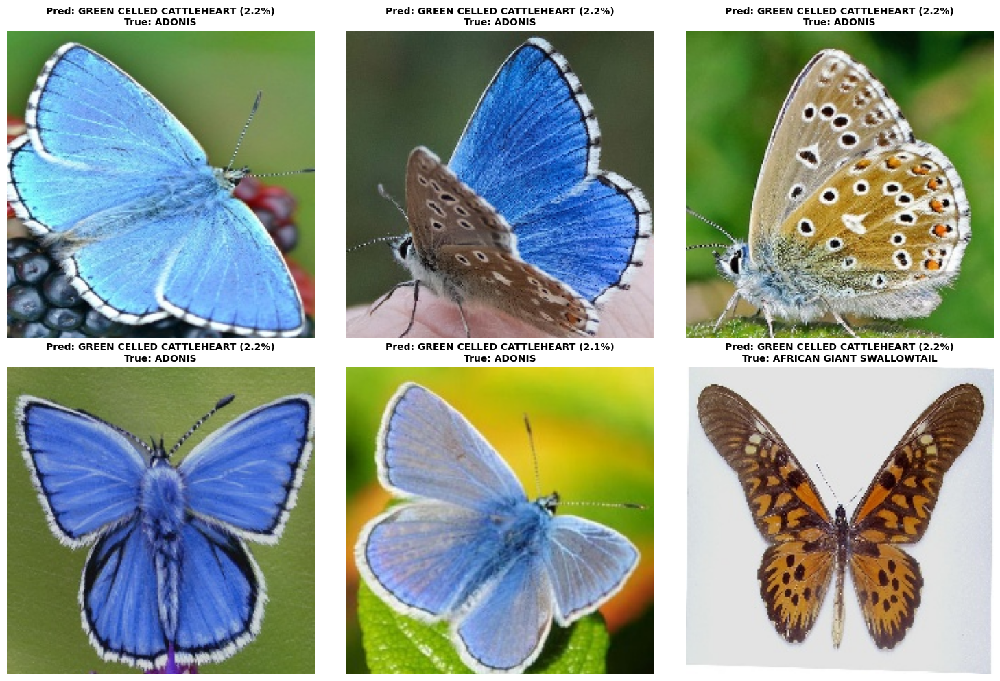

In [31]:
def plot_multiple_images_grid(img_paths, true_labels=None, model=best_model, class_names=class_names, top_n=5, cols=3):
    """
    Predict and plot multiple images in a grid.
    - img_paths: list of image file paths
    - true_labels: list of true species names (optional)
    - top_n: top-N predicted classes to show
    - cols: number of columns in the grid
    """
    n_images = len(img_paths)
    rows = math.ceil(n_images / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    axes = axes.flatten()  # flatten for easy indexing

    for i, img_path in enumerate(img_paths):
        true_label = true_labels[i] if true_labels is not None else None
        pred_probs, img = predict_image_probs(img_path, model=model)

        # Top predicted class and confidence
        top_idx = pred_probs.argsort()[-top_n:][::-1]
        top_vals = pred_probs[top_idx] * 100
        top_labels = [class_names[j] for j in top_idx]
        pred_label = top_labels[0]
        top_conf = top_vals[0]

        # Plot image
        axes[i].imshow(img)
        title = f"Pred: {pred_label} ({top_conf:.1f}%)"
        if true_label is not None:
            title += f"\nTrue: {true_label}"
        axes[i].set_title(title, fontsize=10, fontweight='bold')
        axes[i].axis('off')

    # Hide remaining axes if any
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


# --- Usage Example ---
# Select first 6 images from test set
test_img_paths = df_map[df_map['split']=='test']['filepath'].iloc[:6].tolist()
test_true_labels = df_map[df_map['split']=='test']['species'].iloc[:6].tolist()

plot_multiple_images_grid(test_img_paths, true_labels=test_true_labels, top_n=5, cols=3)


# 17. Custom Predictions ✅
* Test with your own butterfly/moth photos.
* Visualize predictions and probability scores.

In [32]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Butterfly/my_butterflies_photos"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/Butterfly/my_butterflies_photoscloseup-shot-beautiful-zerynthia-rumina-butterfly-blurred-greenery (1).jpg',
 '/content/drive/MyDrive/Butterfly/my_butterflies_photosextreme-close-up-brown-butterfly.jpg',
 '/content/drive/MyDrive/Butterfly/my_butterflies_photospexels-gottapics-7201988.jpg',
 '/content/drive/MyDrive/Butterfly/my_butterflies_photospexels-john-289283-920596.jpg']

In [33]:
# Turn custom images into batch datasets
# Use image_dataset_from_directory to create a dataset from the custom image paths
custom_data = tf.keras.utils.image_dataset_from_directory(
    directory=custom_path,
    label_mode=None,  # Set label_mode to None since custom images are not in class subdirectories
    image_size=(224, 224),
    batch_size=32,
    shuffle=False)

# Normalize pixel values
custom_data = custom_data.map(lambda x: x/255.0)

custom_data

Found 4 files.


<_MapDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [34]:
# Make predictions on the custom data
# Use the 'best_model' variable which holds the loaded trained model
custom_preds = best_model.predict(custom_data)
custom_preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


array([[0.01132515, 0.0106673 , 0.0118215 , 0.00929417, 0.00967015,
        0.01125391, 0.00855589, 0.01174395, 0.01204654, 0.01228317,
        0.01042612, 0.01265841, 0.00983358, 0.00852755, 0.00778728,
        0.00745062, 0.0080419 , 0.01295248, 0.00802495, 0.01203922,
        0.01613317, 0.00892944, 0.0148395 , 0.0074749 , 0.01100833,
        0.01404836, 0.01041803, 0.00468366, 0.00753142, 0.00718549,
        0.00797375, 0.00713746, 0.00897979, 0.0103688 , 0.01025403,
        0.00766987, 0.00772011, 0.00866992, 0.01017936, 0.00955159,
        0.01279082, 0.01241915, 0.00779359, 0.00997569, 0.01044531,
        0.01242546, 0.00705414, 0.02177267, 0.01280331, 0.01075638,
        0.00999109, 0.01079537, 0.00719787, 0.00946293, 0.01106378,
        0.0089607 , 0.01029514, 0.01153774, 0.01385597, 0.01172907,
        0.00920423, 0.00767103, 0.00892261, 0.01005241, 0.01074823,
        0.0080119 , 0.01491066, 0.00755265, 0.00817656, 0.00870844,
        0.00979368, 0.00851867, 0.00978233, 0.00

In [35]:
# Check the custom data shape
custom_preds.shape

(4, 100)

In [36]:
# Define a function to get the predicted label from the prediction probabilities
def get_pred_label(pred_probs):
    """
    Gets the predicted species name from the prediction probabilities.
    """
    top_idx = np.argmax(pred_probs)
    predicted_label = class_names[top_idx]
    return predicted_label

# Get custom image predictions labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['GREEN CELLED CATTLEHEART',
 'GREEN CELLED CATTLEHEART',
 'GREEN CELLED CATTLEHEART',
 'GREEN CELLED CATTLEHEART']

In [37]:
# Get custom images (our unbatchify() function won't work since there aren't labels.... maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image_batch in custom_data.unbatch().as_numpy_iterator():
    # Add the image
    custom_images.append(image_batch)

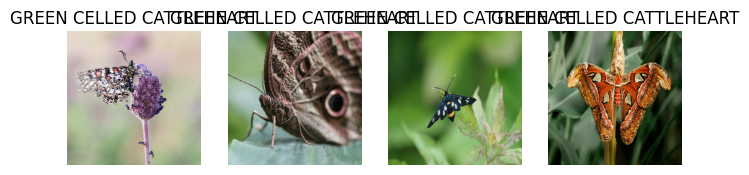

In [38]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    plt.title(f"{custom_pred_labels[i]}")
    plt.axis(False)

In [62]:
# Let's access the class names in the test set
## The first five or more class names
import os

def list_class_directories(test_dir):
    """
    List first five class directory paths
    """
    # Get all class directories
    class_names = [d for d in os.listdir(test_dir)
                   if os.path.isdir(os.path.join(test_dir, d))]

    # Get only the first five class names
    first_five = class_names[:5]

    for class_name in first_five:
        print(f'"/content/drive/MyDrive/Butterfly/test/{class_name}"')

# Specify your test directory path
test_directory = "/content/drive/MyDrive/Butterfly/test"

# Call the function
list_class_directories(test_directory)

"/content/drive/MyDrive/Butterfly/test/ADONIS"
"/content/drive/MyDrive/Butterfly/test/AFRICAN GIANT SWALLOWTAIL"
"/content/drive/MyDrive/Butterfly/test/AMERICAN SNOOT"
"/content/drive/MyDrive/Butterfly/test/AN 88"
"/content/drive/MyDrive/Butterfly/test/APPOLLO"


# 18. Deployment with Gradio (Locally) ✅

In [63]:
# ==============================================================
# 🦋 Butterfly & Moth Classifier – Complete Gradio App
# ==============================================================

# --- 2️⃣ Load trained model ---
best_model = load_model("/content/drive/MyDrive/Butterfly/best_model.keras")

# --- 3️⃣ Load label map & class names ---
with open("/content/drive/MyDrive/Butterfly/label_map.json") as f:
    id_to_species = json.load(f)

# Sort by numeric ID for proper order
class_names = [name for _, name in sorted(id_to_species.items(),
                                          key=lambda x: int(x[0]))]

# --- 4️⃣ Sample directories (update if you add more) ---
sample_dirs = [
    "/content/drive/MyDrive/Butterfly/test/ADONIS",
    "/content/drive/MyDrive/Butterfly/test/AFRICAN GIANT SWALLOWTAIL",
    "/content/drive/MyDrive/Butterfly/test/AMERICAN SNOOT",
    "/content/drive/MyDrive/Butterfly/test/AN 88",
    "/content/drive/MyDrive/Butterfly/test/APPOLLO",
    "/content/drive/MyDrive/Butterfly/test/ARCIGERA FLOWER MOTH",
    "/content/drive/MyDrive/Butterfly/test/ATALA",
    "/content/drive/MyDrive/Butterfly/test/ATLAS MOTH",
    "/content/drive/MyDrive/Butterfly/test/BANDED ORANGE HELICONIAN",
    "/content/drive/MyDrive/Butterfly/test/BANDED PEACOCK",
    "/content/drive/MyDrive/Butterfly/test/BANDED TIGER MOTH",
    "/content/drive/MyDrive/Butterfly/test/BECKERS WHITE",
    "/content/drive/MyDrive/Butterfly/test/BIRD CHERRY ERMINE MOTH",
    "/content/drive/MyDrive/Butterfly/test/BLACK HAIRSTREAK",
    "/content/drive/MyDrive/Butterfly/test/BLUE MORPHO",
    "/content/drive/MyDrive/Butterfly/test/BLUE SPOTTED CROW",
    "/content/drive/MyDrive/Butterfly/test/BROOKES BIRDWING",
    "/content/drive/MyDrive/Butterfly/test/BROWN ARGUS",
    "/content/drive/MyDrive/Butterfly/test/BROWN SIPROETA",
    "/content/drive/MyDrive/Butterfly/test/CABBAGE WHITE",
    "/content/drive/MyDrive/Butterfly/test/CAIRNS BIRDWING",
    "/content/drive/MyDrive/Butterfly/test/CHALK HILL BLUE",
    "/content/drive/MyDrive/Butterfly/test/CHECQUERED SKIPPER",
    "/content/drive/MyDrive/Butterfly/test/CHESTNUT",
    "/content/drive/MyDrive/Butterfly/test/CINNABAR MOTH",
    "/content/drive/MyDrive/Butterfly/test/CLEARWING MOTH",
    "/content/drive/MyDrive/Butterfly/test/CLEOPATRA",
    "/content/drive/MyDrive/Butterfly/test/CLODIUS PARNASSIAN",
    "/content/drive/MyDrive/Butterfly/test/CLOUDED SULPHUR",
    "/content/drive/MyDrive/Butterfly/test/COMET MOTH",
    "/content/drive/MyDrive/Butterfly/test/COMMON BANDED AWL",
    "/content/drive/MyDrive/Butterfly/test/COMMON WOOD-NYMPH",
    "/content/drive/MyDrive/Butterfly/test/COPPER TAIL",
    "/content/drive/MyDrive/Butterfly/test/CRECENT",
    "/content/drive/MyDrive/Butterfly/test/CRIMSON PATCH",
    "/content/drive/MyDrive/Butterfly/test/DANAID EGGFLY",
    "/content/drive/MyDrive/Butterfly/test/EASTERN COMA",
    "/content/drive/MyDrive/Butterfly/test/EASTERN DAPPLE WHITE",
    "/content/drive/MyDrive/Butterfly/test/EASTERN PINE ELFIN",
    "/content/drive/MyDrive/Butterfly/test/ELBOWED PIERROT",
    "/content/drive/MyDrive/Butterfly/test/EMPEROR GUM MOTH",
    "/content/drive/MyDrive/Butterfly/test/GARDEN TIGER MOTH",
    "/content/drive/MyDrive/Butterfly/test/GIANT LEOPARD MOTH",
    "/content/drive/MyDrive/Butterfly/test/GLITTERING SAPPHIRE",
    "/content/drive/MyDrive/Butterfly/test/GOLD BANDED",
    "/content/drive/MyDrive/Butterfly/test/GREAT EGGFLY",
    "/content/drive/MyDrive/Butterfly/test/GREAT JAY",
    "/content/drive/MyDrive/Butterfly/test/GREEN CELLED CATTLEHEART",
    "/content/drive/MyDrive/Butterfly/test/GREEN HAIRSTREAK",
    "/content/drive/MyDrive/Butterfly/test/GREY HAIRSTREAK",
    "/content/drive/MyDrive/Butterfly/test/HERCULES MOTH",
    "/content/drive/MyDrive/Butterfly/test/HUMMING BIRD HAWK MOTH",
    "/content/drive/MyDrive/Butterfly/test/INDRA SWALLOW",
    "/content/drive/MyDrive/Butterfly/test/IO MOTH",
    "/content/drive/MyDrive/Butterfly/test/Iphiclus sister",
    "/content/drive/MyDrive/Butterfly/test/JULIA",
    "/content/drive/MyDrive/Butterfly/test/LARGE MARBLE",
    "/content/drive/MyDrive/Butterfly/test/LUNA MOTH",
    "/content/drive/MyDrive/Butterfly/test/MADAGASCAN SUNSET MOTH",
    "/content/drive/MyDrive/Butterfly/test/MALACHITE",
    "/content/drive/MyDrive/Butterfly/test/MANGROVE SKIPPER",
    "/content/drive/MyDrive/Butterfly/test/MESTRA",
    "/content/drive/MyDrive/Butterfly/test/METALMARK",
    "/content/drive/MyDrive/Butterfly/test/MILBERTS TORTOISESHELL",
    "/content/drive/MyDrive/Butterfly/test/MONARCH",
    "/content/drive/MyDrive/Butterfly/test/MOURNING CLOAK",
    "/content/drive/MyDrive/Butterfly/test/OLEANDER HAWK MOTH",
    "/content/drive/MyDrive/Butterfly/test/ORANGE OAKLEAF",
    "/content/drive/MyDrive/Butterfly/test/ORANGE TIP",
    "/content/drive/MyDrive/Butterfly/test/ORCHARD SWALLOW",
    "/content/drive/MyDrive/Butterfly/test/PAINTED LADY",
    "/content/drive/MyDrive/Butterfly/test/PAPER KITE",
    "/content/drive/MyDrive/Butterfly/test/PEACOCK",
    "/content/drive/MyDrive/Butterfly/test/PINE WHITE",
    "/content/drive/MyDrive/Butterfly/test/PIPEVINE SWALLOW",
    "/content/drive/MyDrive/Butterfly/test/POLYPHEMUS MOTH",
    "/content/drive/MyDrive/Butterfly/test/POPINJAY",
    "/content/drive/MyDrive/Butterfly/test/PURPLE HAIRSTREAK",
    "/content/drive/MyDrive/Butterfly/test/PURPLISH COPPER",
    "/content/drive/MyDrive/Butterfly/test/QUESTION MARK",
    "/content/drive/MyDrive/Butterfly/test/RED ADMIRAL",
    "/content/drive/MyDrive/Butterfly/test/RED CRACKER",
    "/content/drive/MyDrive/Butterfly/test/RED POSTMAN",
    "/content/drive/MyDrive/Butterfly/test/RED SPOTTED PURPLE",
    "/content/drive/MyDrive/Butterfly/test/ROSY MAPLE MOTH",
    "/content/drive/MyDrive/Butterfly/test/SCARCE SWALLOW",
    "/content/drive/MyDrive/Butterfly/test/SILVER SPOT SKIPPER",
    "/content/drive/MyDrive/Butterfly/test/SIXSPOT BURNET MOTH",
    "/content/drive/MyDrive/Butterfly/test/SLEEPY ORANGE",
    "/content/drive/MyDrive/Butterfly/test/SOOTYWING",
    "/content/drive/MyDrive/Butterfly/test/SOUTHERN DOGFACE",
    "/content/drive/MyDrive/Butterfly/test/STRAITED QUEEN",
    "/content/drive/MyDrive/Butterfly/test/TROPICAL LEAFWING",
    "/content/drive/MyDrive/Butterfly/test/TWO BARRED FLASHER",
    "/content/drive/MyDrive/Butterfly/test/ULYSES",
    "/content/drive/MyDrive/Butterfly/test/VICEROY",
    "/content/drive/MyDrive/Butterfly/test/WHITE LINED SPHINX MOTH",
    "/content/drive/MyDrive/Butterfly/test/WOOD SATYR",
    "/content/drive/MyDrive/Butterfly/test/YELLOW SWALLOW TAIL",
    "/content/drive/MyDrive/Butterfly/test/ZEBRA LONG WING",

    ]

# --- 5️⃣ Build dropdown mapping: key -> (filepath, true_species) ---
sample_files_map = {}
for folder in sample_dirs:
    species_name = os.path.basename(folder)
    if os.path.exists(folder):
        for f in os.listdir(folder):
            if f.lower().endswith(('.jpg', '.png')):
                key = f"{species_name}: {f}"
                sample_files_map[key] = (os.path.join(folder, f), species_name)
    else:
        print(f"Warning: Sample directory not found: {folder}")

# --- 6️⃣ Prediction function ---
def predict(uploaded_img=None, sample_choice=None, top_k=5):
    # Choose image: either from dropdown sample or user upload
    if sample_choice and sample_choice in sample_files_map:
        img_path, true_label = sample_files_map[sample_choice]
        img = Image.open(img_path).convert("RGB")
    elif uploaded_img is not None:
        img = uploaded_img.convert("RGB")
        true_label = None
    else:
        return None  # No image provided

    # Preprocess
    img_resized = img.resize((224, 224))
    x = np.expand_dims(np.array(img_resized) / 255.0, axis=0)

    # Model prediction
    preds = best_model.predict(x)[0]
    top_idx = preds.argsort()[-top_k:][::-1]
    top_labels = [class_names[i] for i in top_idx]
    top_vals = preds[top_idx] * 100
    pred_label = top_labels[0]
    top_conf = top_vals[0]

    # Plot: image + bar chart of top predictions
    fig, (ax_img, ax_bar) = plt.subplots(1, 2, figsize=(12, 5))

    title = f"Predict: {pred_label} ({top_conf:.1f}%)"
    if true_label:
        title += f" | True: {true_label}"
    ax_img.imshow(img)
    ax_img.set_title(title, fontweight="bold")
    ax_img.axis("off")

    bars = ax_bar.bar(np.arange(len(top_labels)), top_vals, color="grey")
    ax_bar.set_xticks(np.arange(len(top_labels)))
    ax_bar.set_xticklabels(top_labels, rotation=45, ha="right")
    ax_bar.set_ylabel("Probability (%)")

    # Highlight bar if the true label is among predictions
    if true_label and true_label in top_labels:
        bars[np.argmax(np.array(top_labels) == true_label)].set_color("green")
    else:
        bars[0].set_color("red")

    plt.tight_layout()

    # Convert to image for Gradio output
    buf = io.BytesIO()
    plt.savefig(buf, format="png")
    buf.seek(0)
    plt.close(fig)
    return Image.open(buf)

# --- 7️⃣ Gradio Interface ---
demo = gr.Interface(
    fn=predict,
    inputs=[
        gr.Image(type="pil", label="Upload an image of a butterfly/moth"),
        gr.Dropdown(
            choices=[None] + list(sample_files_map.keys()),
            label="Or pick a sample image",
            value=None
        )
    ],
    outputs="image",
    title="Butterfly & Moth Species Classifier",
    description="Upload a butterfly/moth image or pick a sample to see top predictions."
)

# --- 8️⃣ Launch (auto-share for Colab) ---
demo.launch (share=True)


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 6 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://9716ccf6e8b0ed98d9.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## 1️⃣ Create requirements.txt ✅


In [64]:
# --- Move to project folder ---
project_path = "/content/drive/MyDrive/Butterfly"
os.chdir(project_path)

# --- Essential packages to requirements.txt ---
required_packages = [
    "tensorflow",
    "numpy",
    "pandas",
    "matplotlib",
    "Pillow",
    "gradio",
    "scikit-learn"
]

with open("requirements.txt", "w") as f:
    f.write("\n".join(required_packages))

Add it to your GitHub repo before deploying to Hugging Face Spaces.

# Git and GitHub ✅
* Create a new repository on GitHub.
* Initialize Git and commit
* Link your local repo to GitHub
* Push to Github


In [76]:
# Set up Git configuration first
!git config --global user.email "peter.obi96@yahoo.com"
!git config --global user.name "Petlaz"

In [77]:
# --- 1️⃣ Set project folder ---
project_path = "/content/drive/MyDrive/Butterfly"
%cd $project_path


/content


In [78]:
# --- 2️⃣ Create .gitignore ---
gitignore_content = """\
# Python cache
__pycache__/
*.pyc
*.pyo

# Jupyter
.ipynb_checkpoints/

# Virtual environment
venv/
env/

# Model files
best_model*.keras
*.h5
*.pth
*.pt

# Dataset directories
test/
train/
valid/
my_butterflies_photos/

# Data files
*.csv
*.json
*.zip
*.tar.gz
*.7z

# Gradio cache
.gradio/

# Large files
*.pkl
*.joblib
*.npy
*.npz

# OS files
.DS_Store
Thumbs.db

# IDE files
.vscode/
.idea/
*.swp
*.swo
"""
with open(".gitignore", "w") as f:
    f.write(gitignore_content)
print(".gitignore created successfully!")

.gitignore created successfully!


In [79]:
# --- Define README content ---
readme_content = """
# Butterfly & Moth Species Classifier

This project contains a machine learning model that classifies butterfly and moth species from images.

## Project Files
- `butterfly_moth_classifier.ipynb` – Jupyter notebook with model training & inference
- `best_model.keras` – Trained model
- `label_map.json` – Mapping of class IDs to species names
- `requirements.txt` – Python dependencies

## How to Run
1. Clone the repository
2. Install dependencies: `pip install -r requirements.txt`
3. Run the notebook or deploy with Gradio

## Links
* GitHub: [Your GitHub Link]
* Hugging Face: [Your Hugging Face Link]
"""

# --- Save README.md ---
with open("README.md", "w") as f:
    f.write(readme_content)
print("README.md created successfully!")


README.md created successfully!


In [80]:
# First, let's check what files actually exist
!ls -la

# Check what's in the current directory to see your actual notebook filename
!ls *.ipynb

total 627923
-rw-------   1 root root  74505189 Sep 17 10:32  best_model1.keras
-rw-------   1 root root  73069701 Sep 18 08:52  best_model.keras
-rw-------   1 root root    726722 Apr 21  2023 'butterflies and moths.csv'
-rw-------   1 root root 418471259 Sep 11 14:36 'Butterfly-&-Moths-Image-Classification-100-species.zip'
-rw-------   1 root root  76183400 Apr 21  2023 'EfficientNetB0-100-(224 X 224)- 97.59.h5'
drwx------   7 root root      4096 Sep 18 10:19  .git
-rw-------   1 root root       407 Sep 18 10:24  .gitignore
drwx------   2 root root      4096 Sep 18 10:01  .gradio
drwx------   2 root root      4096 Sep 13 19:37  .ipynb_checkpoints
-rw-------   1 root root      2372 Sep 18 08:52  label_map.json
drwx------   2 root root      4096 Sep 13 19:37  my_butterflies_photos
-rw-------   1 root root       615 Sep 18 10:24  README.md
-rw-------   1 root root        61 Sep 18 10:03  requirements.txt
drwx------ 102 root root      4096 Sep 11 14:42  test
drwx------ 102 root root     

In [81]:
# Check what notebook files you have
!ls "/content/drive/MyDrive/Colab Notebooks/"*.ipynb

'/content/drive/MyDrive/Colab Notebooks/butterfly_and_moth_species_classifier.ipynb'
'/content/drive/MyDrive/Colab Notebooks/dog-vision.ipynb'


In [2]:
# Copy your notebook from Colab Notebooks to the Butterfly directory
import shutil

# Replace with the actual notebook filename
notebook_source = "/content/drive/MyDrive/Colab Notebooks/butterfly_and_moth_species_classifier.ipynb"

# Try to copy the notebook
try:
    shutil.copy(notebook_source, "butterfly_and_moth_species_classifier.ipynb")
    print("Notebook copied successfully!")

    # Verify the file was copied
    print("\nFiles in Butterfly directory after copy:")
    !ls -la *.ipynb

except FileNotFoundError:
    print("Notebook not found. Let's see what notebooks are available:")
    !ls "/content/drive/MyDrive/Colab Notebooks/"*.ipynb

Notebook copied successfully!

Files in Butterfly directory after copy:
-rw------- 1 root root 10825094 Sep 18 10:34 butterfly_and_moth_species_classifier.ipynb
-rw------- 1 root root 10825271 Sep 18 10:31 butterfly_moth_species_classifier.ipynb


In [1]:
# Copy your notebook from Colab Notebooks to the Butterfly directory
import shutil

# Replace 'your_notebook_name.ipynb' with the actual notebook filename
notebook_source = "/content/drive/MyDrive/Colab Notebooks/butterfly_and_moth_species_classifier.ipynb"  # Update this name

# Try to copy the notebook
try:
    shutil.copy(notebook_source, "butterfly_moth_species_classifier.ipynb")
    print("Notebook copied successfully!")
except FileNotFoundError:
    print("Notebook not found. Let's see what notebooks are available:")
    !ls "/content/drive/MyDrive/Colab Notebooks/"*.ipynb

Notebook copied successfully!


In [74]:
# --- 4️⃣ Initialize Git ---
!git init


Reinitialized existing Git repository in /content/drive/MyDrive/Butterfly/.git/


In [75]:
# Remove everything from staging first
!git rm -r --cached .

# Add the updated .gitignore
!git add .gitignore

# Commit the .gitignore first
!git commit -m "Add updated .gitignore"

# Now add only the files you want to track
!git add README.md
!git add requirements.txt
!git add butterfly_moth_classifier.ipynb  # or whatever your notebook is called

# Check status to see what will be added
!git status

# Commit the remaining files
!git commit -m "Add project files"

# Continue with your remote setup
!git remote add origin https://github.com/Petlaz/butterfly-and-moth-species-classifier.git
!git branch -M main
!git push -u origin main

fatal: pathspec '.' did not match any files
Author identity unknown

*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@0cef1fd383a1.(none)')
fatal: pathspec 'butterfly_moth_classifier.ipynb' did not match any files
On branch main

No commits yet

Changes to be committed:
  (use "git rm --cached <file>..." to unstage)
	new file:   .gitignore
	new file:   README.md
	new file:   requirements.txt

Author identity unknown

*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@0cef1fd383a1.(none)')
error: remote origin already e

# Prepare Hugging Face Space ✅

* Create a free Hugging Face account if you don’t have one.

* Go to Hugging Face Spaces
.

* Click New Space → choose Gradio.

* Optionally, link it to your GitHub repo, or upload your files directly.

* Make sure your app launches correctly:

   * If using a notebook, ensure the last cell launches the Gradio app:

   demo.launch()

* If using a Python script app.py, it should include:

if __name__ == "__main__":
    demo.launch()

* Hugging Face will automatically detect dependencies from requirements.txt.

* Test Deployment

  * Open your Hugging Face Space URL.
  * Test both uploaded images and sample images to ensure predictions work.
